# Experimental Analysis on Smartyields' Monitoring Dataset

## Abstract
This project focuses on the analysis of a sensor measurements data provided by the Smartyields company. We explored this dataset by exploring the attributes, looking meaningful relations in the data, further grouping and experimenting on attributes, clustering by real distance and comparative approach to datapoints with common attributes. After these experiments, we share our comments and possible future work on the data.

## Introduction
As the technology getting deeper into our lives everyday, one of the areas that benefit from that development is agriculture. Smart Yields use of data combined into hardware and software components as wireless sensors solutions for farmers in areas stricken by cold frost to improve the farmers yield of crops impress us enough to take on the project. By this purpose, Smartyields collected the data from these sensors and provided a small portion of that dataset for us to explore [1].  
To make this analysis, first we come up with some questions. We tried to provide answers to these questions - these questions were developed without having any experience with Agriculture or farming;
* How can crop monitoring ensure the health of the crop, at different levels of growth stages?
* How accurate are the wireless sensors? 
* How many sensors are needed to provide relatively accurate data?
* What conditions of the crops before and after monitoring?
* Could our findings provide a visualize assessment of data accuracy?
* How do we account for the unknowns?
* Provide data sharing within regions to minimize the number of sensors deployed?
  
This analysis first provide general information about the data provided. Looking at the dataset and the attributes led us to deeper explorations, we looked for correlations, data distributions and discover the deeper aspects of the dataset with some experimental work. Further, we applied clustering to the data by distance, using latitude and longitude values to observe the local differences. Following clustering, we plotted the locally clustered data on real world images provided by satellites. Finally we grouped the datapoints by their attributes to prepare the time based plots. We created time based temperature and humidity measurements for each sensor on the field and questioned the abnormalities. We conclude the analysis by presenting our observations.
## Background
In this project, we looked at the data on the aspect of "What this data is?" rather than "What we can do with this data?". The main reason is we couldn't use the data without knowing what it is, so we analysed the dataset with experiments. Looking deeper on the dataset bring us more questions to answer. We developed a series of python based code to dig the dataset, therefore there are some necessary background information we need to provide to have some clarity on the work we have done.  
We build this project based on a conda environment running on python 3.6. Here are some libraries needs to be installed to run the code;
* Numpy, Scipy: NumPy is the fundamental package provided by SciPy for scientific computing with Python. SciPy is a Python-based ecosystem of open-source software for mathematics, science, and engineering [2]. 
* Pandas: Pandas is an open source library providing high-performance, easy-to-use data structures and data analysis tools for the Python programming language [3].
* Matplotlib: Matplotlib is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms [4].
* Basemap: The matplotlib basemap toolkit is a library for plotting 2D data on maps in Python [5].
* Scikit-Learn MiniBatch K-Means Clustering: The MiniBatchKMeans is a variant of the KMeans algorithm which uses mini-batches to reduce the computation time, while still attempting to optimise the same objective function. Mini-batches are subsets of the input data, randomly sampled in each training iteration. These mini-batches drastically reduce the amount of computation required to converge to a local solution [6].

In [1]:
#Libraries used in the project
import numpy as np
import scipy as sc
import pandas as pd #to import data
import matplotlib.pyplot as plt #to plot data
import matplotlib.colors as colors
import seaborn as sns #to violinplot the distributions, pairplot the attributes
from mpl_toolkits.basemap import Basemap #to plot data on real world map
from sklearn.cluster import MiniBatchKMeans
from itertools import cycle
from datetime import datetime

C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\sklearn\utils\fixes.py:313: FutureWarning: numpy not_equal will not check object identity in the future. The comparison did not return the same result as suggested by the identity (`is`)) and will change.
  _nan_object_mask = _nan_object_array != _nan_object_array


## Data
The main focus in this project is on Smartyields' sensor measurements partial dataset. We support this data with arcgisimage images provided by basemap [5]. We gathered high definition satellite images of Colorado State with given latitude and longitude values in Smartyields dataset. The main dataset by Smartyields and arcgisimage is the only data used in this project, but for future work there might be other datasets can be helpful.
## Methodology

To analyze the Smartyields dataset, we explored the data from several aspects. In this part of the paper we provide detailed information about the processes we have applied and experiments we have done. Required by the nature of an experimental analysis, as we answered some questions we also come up with more questions. Here in this project we provided some answers to the important aspects of the Smartyields sensor measurement dataset.
### First look on the data
First thing we do is to load the data to a platform that we can experiment on. We prepared an anaconda environment with python 3.6 and installed required packages mentioned previously. After we get the environment ready, we used pandas to load the dataset provided in Comma Seperated Value format (.csv) into the python environment. Then we looked at what's inside (by using .head() and .tail() functions provided by pandas [3]).

In [2]:
# data = Original dataset in dataFrame format with header column and id attribute
data = pd.read_csv("data/SensorTablePartial.csv")
# d = data in numpy array format
d = np.asarray(data)
# permuteddata = d permuted in numpy array format
permuteddata = np.random.permutation(d)
#First 5 elements of the data
data.head()

,id,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
0,00SUN1,1522196702,16.3,20.0,38.816743,-107.782709,0
1,00SUN1,1522196852,16.0,21.5,38.816743,-107.782709,0
2,00SUN1,1522197002,16.1,20.5,38.816743,-107.782709,0
3,00SUN1,1522197152,16.2,20.5,38.816743,-107.782709,0
4,E7Y1NM,1522196898,11.9,30.0,38.816330,-107.793882,0


In [3]:
#Last 5 elements of the data
data.tail()

,id,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
836663,GNMCD5,1525812612,31.6,16.0,39.073931,-108.410991,0
836664,GNMCD5,1525812762,31.9,13.5,39.073931,-108.410991,0
836665,OZTUJH,1525812344,38.1,8.0,39.096057,-108.364281,0
836666,OZTUJH,1525812494,38.8,8.0,39.096057,-108.364281,0
836667,OZTUJH,1525812644,39.4,8.0,39.096057,-108.364281,0


In [4]:
#Dataset Shape (Number of datapoints, number of attributes for each datapoint)
d.shape

(836668, 7)

There are some observations that are important for the project. As we can see from above, each datapoint in the dataset is a single measurement. This single measurement has 7 attributes:
* id: Indicates the sensor id that these measurements are made by.
* timestamp: 11 digit integer, UNIX date encoding. Indicates the time that measurement made on [7].
* temp$\_$celsius: Temperature in Celsius format.
* rel$\_$humidity: Humidity in percentage.
* latitude
* longitude: Coordinates of the sensor.
* movement: Something related to the sensor replacement. We couldn't get a proper answer for this even from the senior programmer and co-founder. Still is a mystery to us.
  
One more important aspect we can see from these plots is the number of the datapoints in the dataset. There are 836668 datapoints in total, which is a big number for low computational power we have. But with the deeper exploration we observed that this dataset is partial and limited within a certain time window, hence, working on the whole data might require much more processing power than we have.

### Unique Values and Distributions

The first look was naturally basic, but here we explore the data on its attributes. The first thing caught our attention was id values. Figure 1 shows that id values are not unique for each datapoint, in contrast, there are lots of datapoints that share the same id, because they are different measurements taken by the same sensor. To provide a better insight to the data, we examined the unique values and their distributions. Plotting the unique values with numpy's .unique() function [2] gives us the following output:

In [5]:
#Empty lists for each unique value and count of that value
aa, bb = [], []
#Gathering values and quantity
for i in range(d.shape[1]):
    a,b = np.unique(d[:,i], return_counts=True)
    aa.append(a)
    bb.append(b)
    print("Unique values in %s column: %s" % (data.columns.tolist()[i], len(b)))

Unique values in id column: 127
Unique values in timestamp column: 701113
Unique values in temp_celsius column: 664
Unique values in rel_humidity column: 201
Unique values in latitude column: 89
Unique values in longitude column: 89
Unique values in movement column: 5


In [6]:
#Deleting the timstamp column (Impossible to plot 701113 unique values)
del aa[1]
del bb[1]
data2 = data
data2 = data2.drop(columns="timestamp")

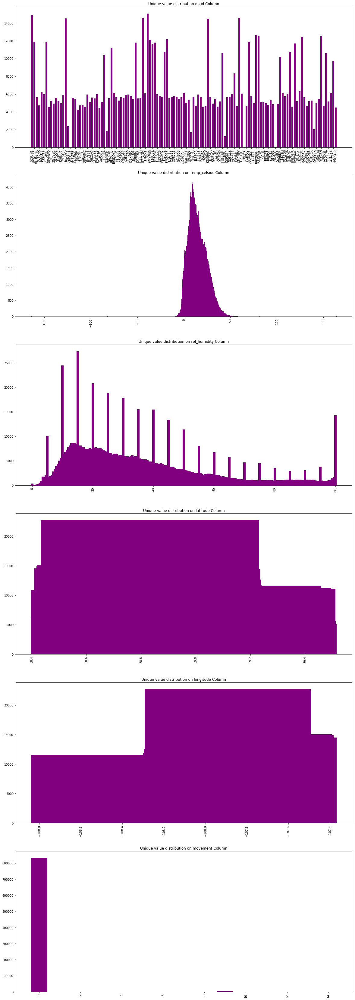

In [7]:
#Plotting unique values for each data attribute (except timestamp)
#6 subplots with 1 plot for each row.
fig, ax = plt.subplots(6, 1, figsize=(20,60))
ax.ravel()
for i in range(6):
    np.max(bb[i])
    #Get data attribute header
    ax[i].set_title("Unique value distribution on %s Column" %data2.columns.tolist()[i] )
    #Using bar function to plot results on a bar chart
    ax[i].bar(aa[i], bb[i], color="purple")
#Rotate x-axis labels for readability
for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=90)
plt.savefig("./out/p1-unique_value_distribution.png")
plt.show()

In [8]:
#Show unique values - Movement column only (other columns have large scale)
print("Unique values and their amount for %s column:" % data2.columns.tolist()[5])
print("%-6s" % aa[5])
print("%-6s" % bb[5])

Unique values and their amount for movement column:
[0 9 10 13 14]
[832346   3399    786      1    136]


These results provides us valuable information on the dataset we are working on. First, the 127 unique id values indicate that there are 127 different sensors that took at least one measurement in this dataset. Timestamp values having a large number of unique values indicate the measurements are not synchronized for the majority of measurements. Temperature values have 664 values looks too much and might contain some inaccurate measurements. Humidity has the same comment for temperature. Latitude and longitude values are same as expected.  
We plotted the distributions to observe the data structure, above plots show the number of datapoints over attributes. As we can see from the first plot, there are id's with very few measurements which is abnormal. Temperature distribution looks like a Gaussian distribution as expected. Humidity measurements have this distinctively visible error in the plot. The number of 5's multipliers on percentages got 4 times more records than other numbers. Our guess about this was either broken sensors or rounding to closest 5 percent. We asked the issue to data providers and they answered this question as a programming fault that ended up with wrong type of rounding.  
Looking at the unique values for the movement column led us to discover there are total 5 different movement values in the dataset and those values are; 0, 9, 10, 13 and 14. When we asked Smartyields folks about it, they answered with; "There should be only 0 and 1 in the dataset. We don't know where the error comes from..."

In [9]:
#Data values
'''
Counts are same for each attribute, there's no missing field in the dataset.
'''
data.describe()

,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
count,8.366680e+05,836668.000000,836668.000000,836668.000000,836668.000000,836668.000000
mean,1.524454e+09,14.796983,36.171917,38.909663,-108.013254,0.048249
std,9.186144e+05,9.761613,23.701154,0.124981,0.277721,0.672863
min,1.522197e+09,-163.900000,0.000000,38.796464,-108.440651,0.000000
25%,1.523637e+09,7.500000,17.500000,38.814443,-108.366633,0.000000
50%,1.524675e+09,13.400000,30.000000,38.833719,-107.893285,0.000000
75%,1.525242e+09,21.400000,48.500000,39.059508,-107.780718,0.000000
max,1.525813e+09,163.800000,100.000000,39.115519,-107.767600,14.000000


A useful function for pandas dataframe is .describe() function [3]. This function runs the code to calculate major important mathematical calculations and present the results in table format, we presented it in Figure 3. The most important part is the extreme temperature values at min of -163 degrees Celsius and max of 163 degrees Celsius, these temperatures converts to approximately -261.4 Fahrenheit and 325-degree Fahrenheit.

### Correlations

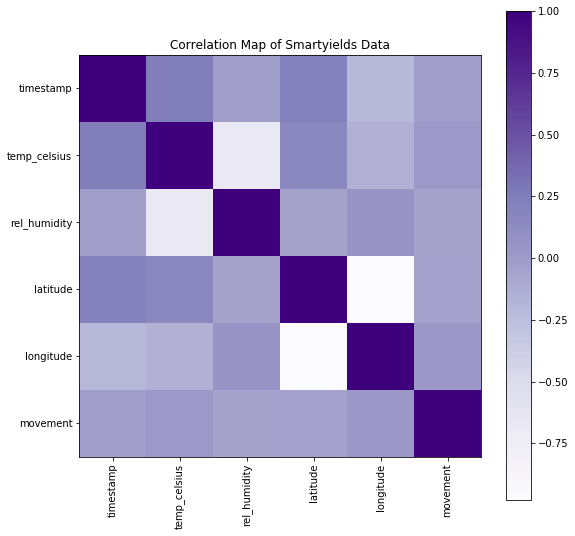

In [10]:
def plot_corr(df,size=8):
    corr = df.iloc[:,1:size].corr()
    fig, ax = plt.subplots(figsize=(9, 9))
    ax.tick_params(axis="x", labelrotation=90)
    plt.title("Correlation Map of Smartyields Data")
    plt.imshow(corr, cmap=plt.cm.Purples, interpolation="nearest")
    plt.colorbar()
    plt.xticks(range(len(corr.columns)), corr.columns);
    plt.yticks(range(len(corr.columns)), corr.columns);
    plt.savefig("./out/p2-correlation_map.png")
plot_corr(data, size=11)

In [11]:
#Correlation
dcorr = data.corr()
dcorr

,timestamp,temp_celsius,rel_humidity,latitude,longitude,movement
timestamp,1.000000,0.248423,-0.025491,0.217523,-0.212495,-0.018821
temp_celsius,0.248423,1.000000,-0.678213,0.161122,-0.158742,0.023114
rel_humidity,-0.025491,-0.678213,1.000000,-0.050519,0.053996,-0.046255
latitude,0.217523,0.161122,-0.050519,1.000000,-0.981003,-0.038943
longitude,-0.212495,-0.158742,0.053996,-0.981003,1.000000,0.028599
movement,-0.018821,0.023114,-0.046255,-0.038943,0.028599,1.000000


Figure above provides us information about the correlation between the data attributes. There are two negative strong correlations observable; latitude and longitude has a negative 1 correlation which we are completely confused by and still could not explained. The other negative strong correlation is between temperature and humidity, which we were expecting to see. There are no other strong correlations between the data attributes in the dataset.

### Experiments with Latitude and Longitude
The dataset provided by Smartyields contains latitude and longitude information for each datapoint. Obviously (if not edited in the process) the id's and latitude-longitude values match. That means we have real location indicators for each measurement. With this information we experimented on location values.  
First we examined the extreme values to be able to draw borders for our plots using location information. Here are some output from our code designed for this task:

In [12]:
#Finding the maximum values of Latitude and Longitude
lat_max = data['latitude'].max()
lat_min = data['latitude'].min()
lon_max = data['longitude'].max()
lon_min = data['longitude'].min()
print("Latitude max & min: %.6f , %.6f" % (lat_max, lat_min))
print("Longitude max & min: %.6f , %.6f" % (lon_max, lon_min))
lat_dist = np.absolute(lat_max - lat_min)
lon_dist = np.absolute(lon_max - lon_min)
print("Distance Latitude: %.6f , Longitude: %.6f" % (lat_dist, lon_dist))
lat_dist_m = (lat_dist + 0.1) * 111000
lon_dist_m = (lon_dist + 0.1) * 111000
print("Distance METERs Latitude: %.6f , Longitude: %.6f" % (lat_dist_m, lon_dist_m))
lat_cent = lat_min + lat_dist/2
lon_cent = lon_min + lon_dist/2
print("Center values for mapping Latitude: %.6f , Longitude: %.6f" % (lat_cent, lon_cent))
lat_st = lat_min - 0.1
lat_en = lat_max + 0.1
lon_st = lon_min - 0.1
lon_en = lon_max + 0.1

Latitude max & min: 39.115519 , 38.796464
Longitude max & min: -107.767600 , -108.440651
Distance Latitude: 0.319055 , Longitude: 0.673051
Distance METERs Latitude: 46515.105000 , Longitude: 85808.661000
Center values for mapping Latitude: 38.955991 , Longitude: -108.104126


In [13]:
#Get ticks for each 0.1 degree difference with 'np.around' check
lat_st = np.around(lat_min - 0.05, decimals=1) if lat_st > lat_min else np.around(lat_min, decimals=1)
lat_en = np.around(lat_max + 0.05, decimals=1) if lat_en < lat_max else np.around(lat_max, decimals=1)
lon_st = np.around(lon_min - 0.05, decimals=1) if lon_st > lon_min else np.around(lon_min, decimals=1)
lon_en = np.around(lon_max + 0.05, decimals=1) if lon_en < lon_max else np.around(lon_max, decimals=1)
#Assign spacing to values and create a ticks list for plot
lat_ticks = np.linspace((lat_st - 0.1), (lat_en + 0.1), (np.around(lat_en-lat_st, decimals=1)*10+3))
lon_ticks = np.linspace((lon_st - 0.1), (lon_en + 0.1), (np.around(lon_en-lon_st, decimals=1)*10+3))
print("Latitude start - end points: %.1f, %.1f" % (lat_st, lat_en))
print("Longitude start - end points: %.1f, %.1f" % (lon_st, lon_en))

Latitude start - end points: 38.8, 39.1
Longitude start - end points: -108.4, -107.8


C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  import sys
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  


### Data Plot with Latitude and Longitude

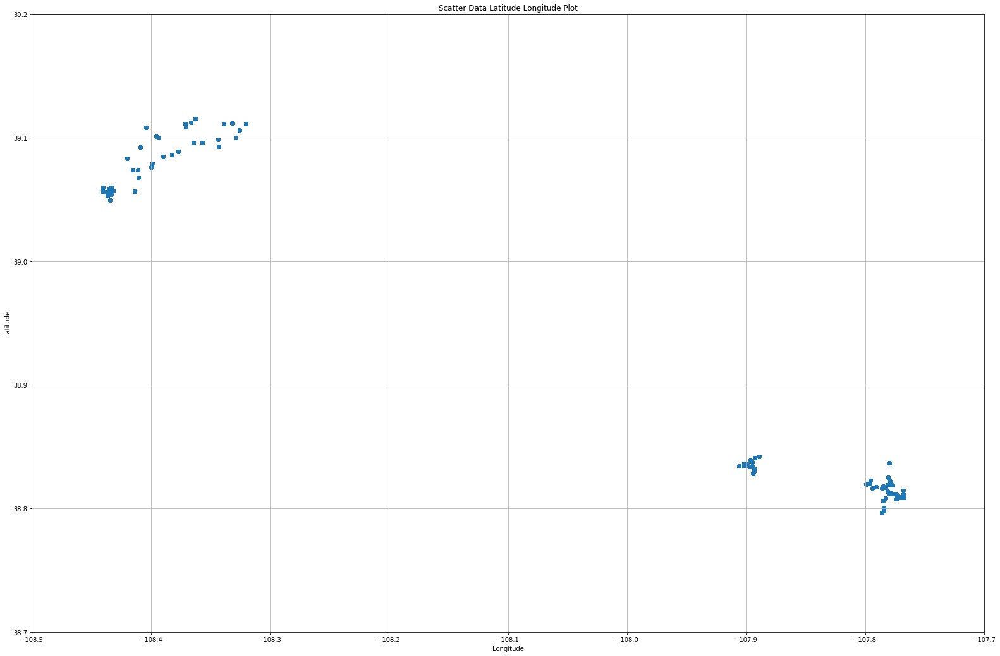

In [14]:
#Scatter points on latitude and longitude
plt.figure(figsize=(len(lon_ticks)*3, len(lat_ticks)*3))
plt.autoscale(enable=True, axis='both', tight=True)
plt.scatter(data["longitude"], data["latitude"])
plt.title("Scatter Data Latitude Longitude Plot")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
#Use the max and mins for latitude and longitude, added some spacing
plt.xticks(lon_ticks)
plt.yticks(lat_ticks)
plt.grid()
plt.savefig("./out/p3-scatter_latlon.png")
plt.show()

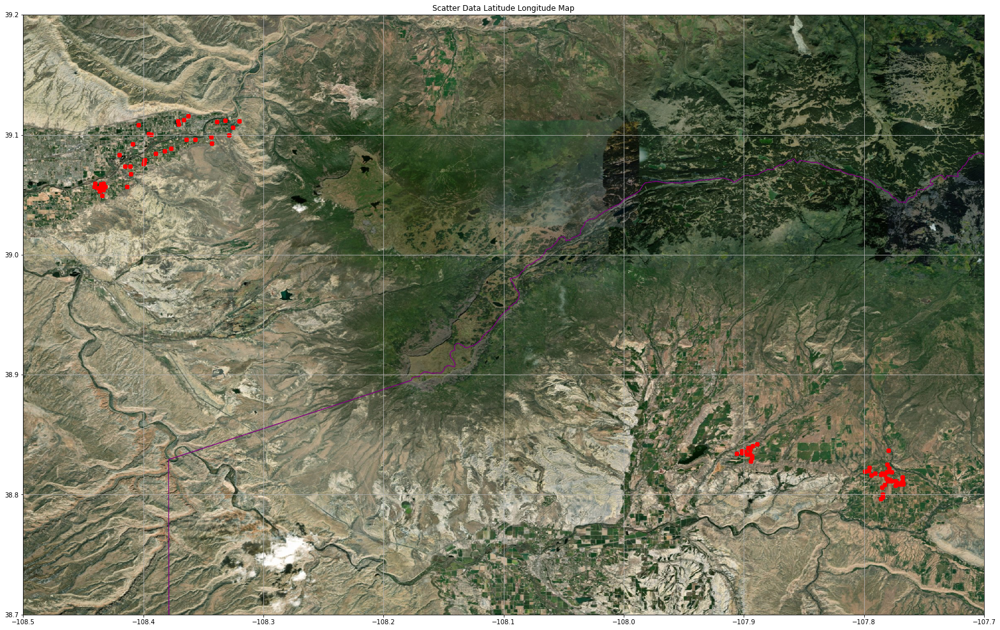

In [15]:
'''Important information about basemap
@llcrnrlon, @urcrnrlon  : Degree value for LOW - LEFT and UP - RIGHT CORNER longitude of the map. Assigned above.
@llcrnrlat, @llcrnrlat  : Degree value for LOW - LEFT and UP - RIGHT CORNER latitude of the map. Assigned above.
@projection     : Type of projection to use, cylindric method used.
@resolution     : Quality of background images.
@epsg           : Background picture epsg code. 4269 is for United States.
Arcgisimage
@service : High quality map provider to use. World_Imagery servide used.
@verbose : Print Map server information when True.
@dpi     : Dot per inch, resolution quality.
@xpixels : Number of pixels on x axis of the map image.
'''
plt.figure(figsize=(len(lon_ticks)*3, len(lat_ticks)*3))
plt.autoscale(enable=True, axis='both', tight=True)
#Draw the map with given latitude and longitude values, used cylindric projection in this - 'cyl'
m = Basemap(projection='cyl', resolution='i', llcrnrlon=lon_st - 0.1, urcrnrlon=lon_en + 0.1, llcrnrlat=lat_st - 0.1, urcrnrlat=lat_en + 0.1 , epsg=4269)
#Arcgisimage is used for a high resolution map
m.arcgisimage(service = 'World_Imagery', xpixels = 3500, dpi=500, verbose=False)
#Other details on the map
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawcounties(color='purple', linewidth=1)
m.drawstates(color='gray')
#Convert degrees to meters (for scatter plot)
_x, _y = m(np.asarray(data['longitude']), np.asarray(data['latitude']))
m.scatter(_x, _y, color='r', alpha=0.5)
plt.title("Scatter Data Latitude Longitude Map")
plt.xticks(lon_ticks)
plt.yticks(lat_ticks)
plt.grid()
plt.savefig("./out/p4-scatter_latlon_map.png")
plt.show()

### Clustering with MiniBatch K-Means
Clustering we know that using one common type of visualization in data science was geographic data, being we have longitude and latitude. Using Matplotlib as the main tool for this type of visualization known as the Basemap [4][5].  Plotting data on map geographical area of the regionals of cold frost particularly in Colorado.  MiniBatch K-Means Clustering was used to run a clustering algorithm to group datapoints that are geologically close to each other and results are plotted using arcgisimage by basemap [5].  Separating data into clusters by the label from MiniBatch K-Means provided the number of datapoints in 1st, 2nd, and 3rd cluster respectively:

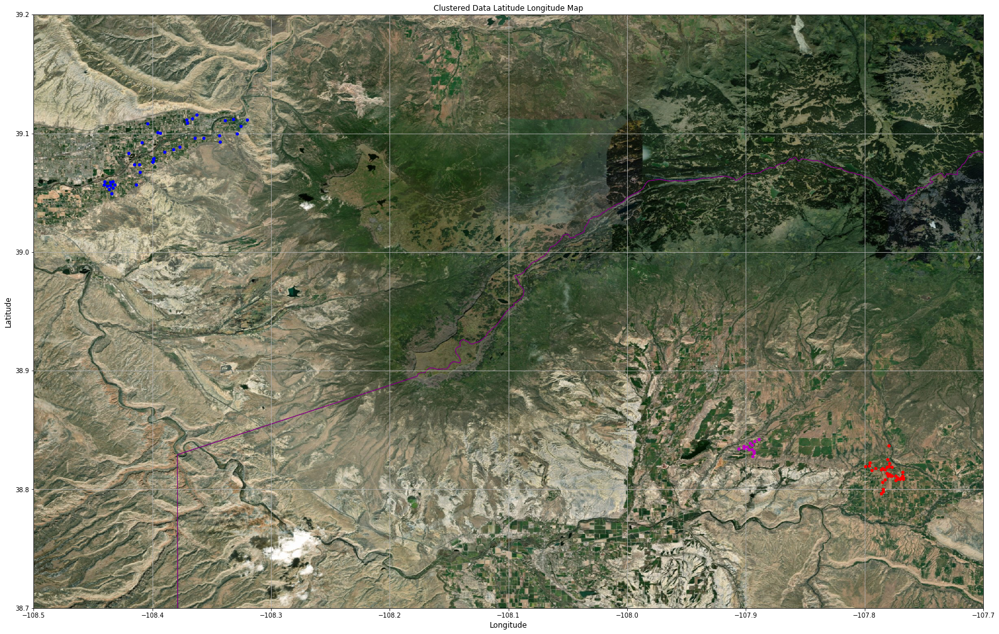

In [16]:
'''Run a clustering algorithm to group datapoints that are geologically close to each other.
Since the number of clusters are obvious from previous plots, just used the number.
'''
#Define a mini batch K Means clustering (time efficient)
mbatch = MiniBatchKMeans(n_clusters=3, batch_size=5, n_init=10, max_no_improvement=10, verbose=0)
#Create the grid with corresponding size (latitude and longitude axis values defined above)
x, y = np.meshgrid(lon_ticks, lat_ticks)
#Seperate the geolocation data from dataframe to a list
X = data.loc[:, ['longitude', 'latitude']]
mbatch.fit(X)
ptsymb = np.array(['b.','r.','m.']) #Colors
plt.figure(figsize=(len(lon_ticks)*3, len(lat_ticks)*3))
plt.autoscale(enable=True, axis='both', tight=True)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=lon_st - 0.1, urcrnrlon=lon_en + 0.1, llcrnrlat=lat_st - 0.1, urcrnrlat=lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'World_Imagery', xpixels = 3500, dpi=500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.title("Clustered Data Latitude Longitude Map")
plt.ylabel('Latitude', fontsize=12)
plt.xlabel('Longitude', fontsize=12)
for i in range(3):
    #Pick every member of the corresponding (i) cluster and plot it
    cluster=np.where(mbatch.labels_==i)[0]
    plt.plot(X.longitude[cluster].values,X.latitude[cluster].values,ptsymb[i])
plt.xticks(lon_ticks)
plt.yticks(lat_ticks)
plt.grid()
plt.savefig("./out/p5-cluster_latlon_map.png")
plt.show()

In [17]:
'''This might take a while - few minutes'''
#Separating data into clusters by the label from MiniBatchKMeans
c1, c2, c3 = [], [], []
for i in range(len(mbatch.labels_)):
    if mbatch.labels_[i] == 0:
        c1.append(data.iloc[i])
    elif mbatch.labels_[i] == 1:
        c2.append(data.iloc[i])
    elif mbatch.labels_[i] == 2:
        c3.append(data.iloc[i])
c1a = np.asarray(c1)
c2a = np.asarray(c2)
c3a = np.asarray(c3)
print("Number of Datapoints in 1st cluster: %i " % len(c1a))
print("Number of Datapoints in 2nd cluster: %i " % len(c2a))
print("Number of Datapoints in 3rd cluster: %i " % len(c3a))

Number of Datapoints in 1st cluster: 283308 
Number of Datapoints in 2nd cluster: 373876 
Number of Datapoints in 3rd cluster: 179484 


Applying numpy's .unique() function for each cluster gives us the number of sensors in each cluster. This grouping looks like an important aspect and in the future work requiring any grouping the technique we applied might prove useful. Number of sensors are;

In [18]:
#We can find number of sensors by taking unique id values from each cluster's datapoints
n_c1 = np.unique(c1a[:,0])
n_c2 = np.unique(c2a[:,0])
n_c3 = np.unique(c3a[:,0])
print("Number of sensors in cluster 1: %i" % len(n_c1))
print("Number of sensors in cluster 1: %i" % len(n_c2))
print("Number of sensors in cluster 1: %i" % len(n_c3))
print("Total number of sensors: %i" % (len(n_c1) + len(n_c2) + len(n_c3)))

Number of sensors in cluster 1: 55
Number of sensors in cluster 1: 56
Number of sensors in cluster 1: 16
Total number of sensors: 127


In [19]:
'''
This part contains the calculation for the minimum and maximum longitude and latitude values
for each cluster. After finding min & max, we calculate distances and use these for drawing the grid.
'''
#Finding the maximum values of Latitude and Longitude
c1lat_max, c1lat_min, c1lon_max, c1lon_min = c1a[:,4].max(), c1a[:,4].min(), c1a[:,5].max(), c1a[:,5].min()
c2lat_max, c2lat_min, c2lon_max, c2lon_min = c2a[:,4].max(), c2a[:,4].min(), c2a[:,5].max(), c2a[:,5].min()
c3lat_max, c3lat_min, c3lon_max, c3lon_min = c3a[:,4].max(), c3a[:,4].min(), c3a[:,5].max(), c3a[:,5].min()
c1lat_st, c1lat_en, c1lon_st, c1lon_en = c1lat_min - 0.1, c1lat_max + 0.1, c1lon_min - 0.1, c1lon_max + 0.1
c2lat_st, c2lat_en, c2lon_st, c2lon_en = c2lat_min - 0.1, c2lat_max + 0.1, c2lon_min - 0.1, c2lon_max + 0.1
c3lat_st, c3lat_en, c3lon_st, c3lon_en = c3lat_min - 0.1, c3lat_max + 0.1, c3lon_min - 0.1, c3lon_max + 0.1
c1lat_st = np.around(c1lat_min - 0.05, decimals=1) if c1lat_st > c1lat_min else np.around(c1lat_min, decimals=1)
c1lat_en = np.around(c1lat_max + 0.05, decimals=1) if c1lat_en < c1lat_max else np.around(c1lat_max, decimals=1)
c1lon_st = np.around(c1lon_min - 0.05, decimals=1) if c1lon_st > c1lon_min else np.around(c1lon_min, decimals=1)
c1lon_en = np.around(c1lon_max + 0.05, decimals=1) if c1lon_en < c1lon_max else np.around(c1lon_max, decimals=1)
c1lat_ticks = np.linspace((c1lat_st - 0.1), (c1lat_en + 0.1), (np.around(c1lat_en-c1lat_st, decimals=1)*10+3))
c1lon_ticks = np.linspace((c1lon_st - 0.1), (c1lon_en + 0.1), (np.around(c1lon_en-c1lon_st, decimals=1)*10+3))
c2lat_st = np.around(c2lat_min - 0.05, decimals=1) if c2lat_st > c2lat_min else np.around(c2lat_min, decimals=1)
c2lat_en = np.around(c2lat_max + 0.05, decimals=1) if c2lat_en < c2lat_max else np.around(c2lat_max, decimals=1)
c2lon_st = np.around(c2lon_min - 0.05, decimals=1) if c2lon_st > c2lon_min else np.around(c2lon_min, decimals=1)
c2lon_en = np.around(c2lon_max + 0.05, decimals=1) if c2lon_en < c2lon_max else np.around(c2lon_max, decimals=1)
c2lat_ticks = np.linspace((c2lat_st - 0.1), (c2lat_en + 0.1), (np.around(c2lat_en-c2lat_st, decimals=1)*10+3))
c2lon_ticks = np.linspace((c2lon_st - 0.1), (c2lon_en + 0.1), (np.around(c2lon_en-c2lon_st, decimals=1)*10+3))
c3lat_st = np.around(c3lat_min - 0.05, decimals=1) if c3lat_st > c3lat_min else np.around(c3lat_min, decimals=1)
c3lat_en = np.around(c3lat_max + 0.05, decimals=1) if c3lat_en < c3lat_max else np.around(c3lat_max, decimals=1)
c3lon_st = np.around(c3lon_min - 0.05, decimals=1) if c3lon_st > c3lon_min else np.around(c3lon_min, decimals=1)
c3lon_en = np.around(c3lon_max + 0.05, decimals=1) if c3lon_en < c3lon_max else np.around(c3lon_max, decimals=1)
c3lat_ticks = np.linspace((c3lat_st - 0.1), (c3lat_en + 0.1), (np.around(c3lat_en-c3lat_st, decimals=1)*10+3))
c3lon_ticks = np.linspace((c3lon_st - 0.1), (c3lon_en + 0.1), (np.around(c3lon_en-c3lon_st, decimals=1)*10+3))

C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:16: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  app.launch_new_instance()
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:23: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-packages\ipykernel_launcher.py:28: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
C:\Users\User\Miniconda3\envs\ds_proj\lib\site-

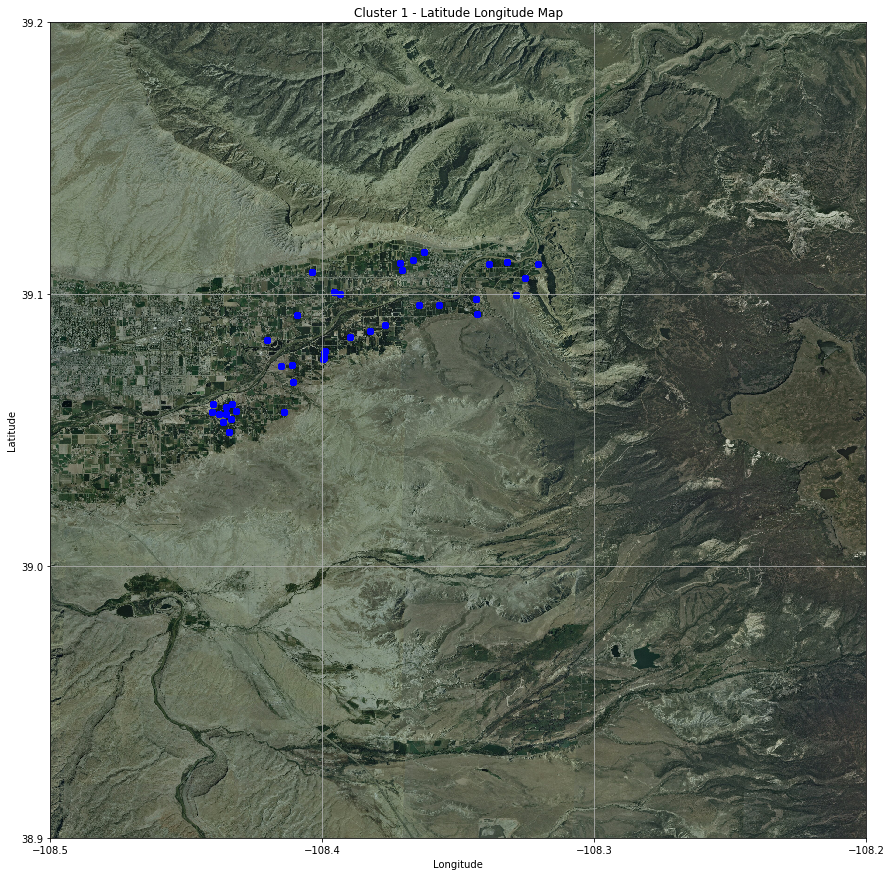

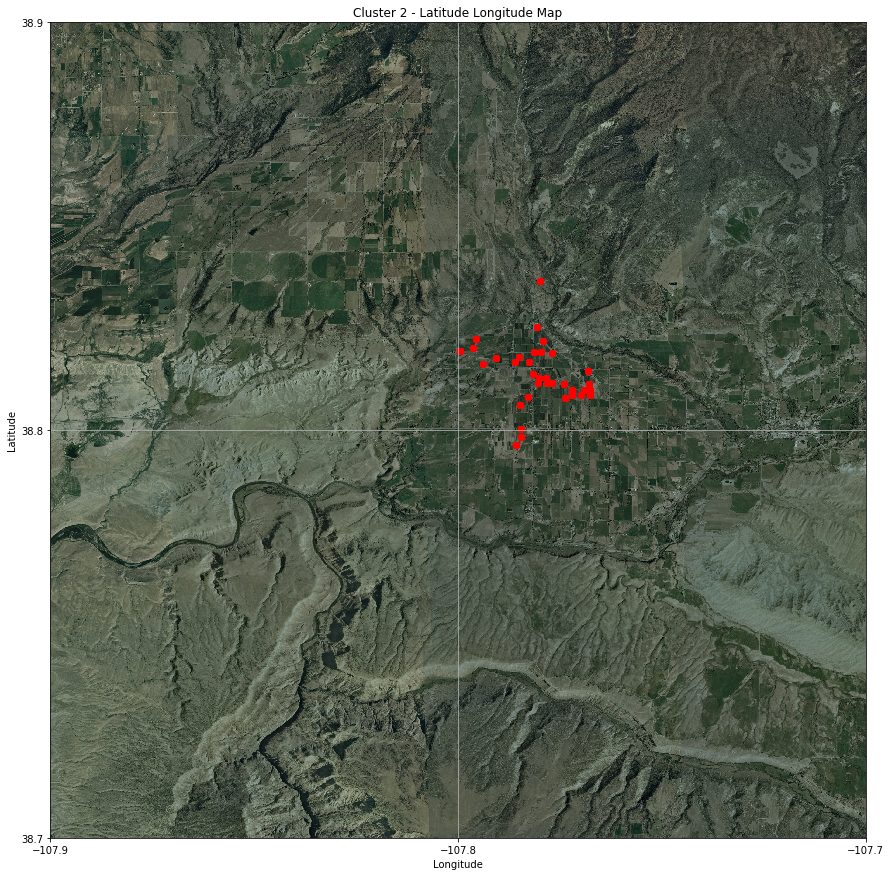

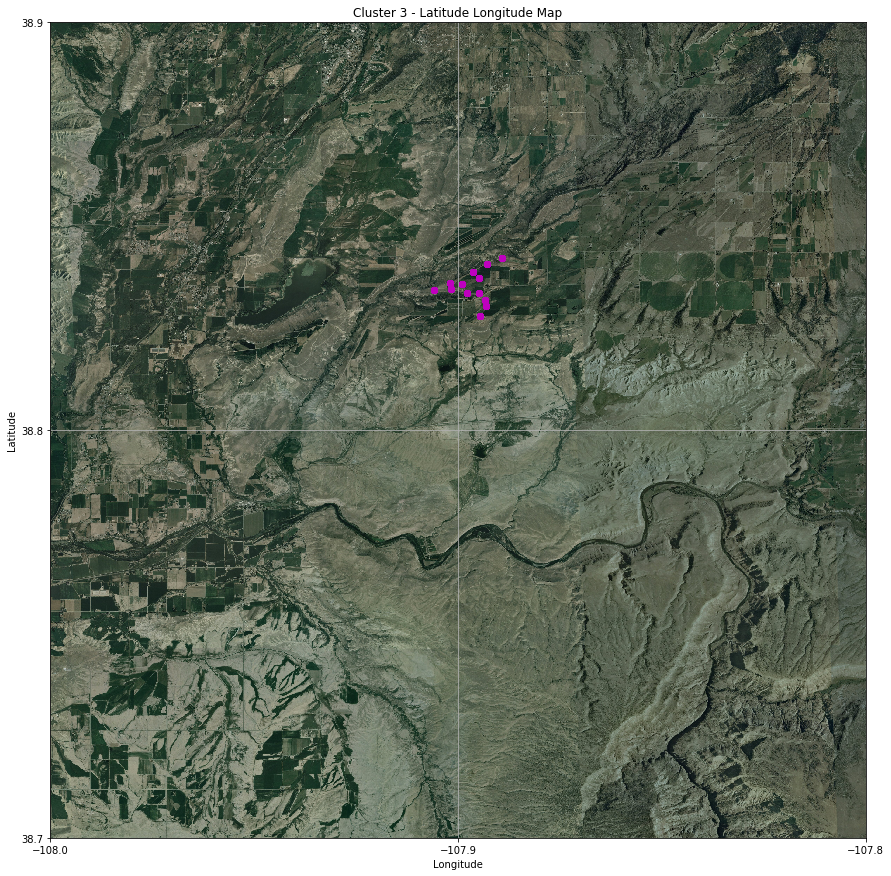

In [20]:
'''
In this part, different clusters are plotted separately.
For each cluster, minimum and maximums for longitude and latitude values for that cluster's members
are calculated above.
Changed background map from World_Imagery to ESRI_Imagery_World_2D, just to see if there are differences.


'''
#Plot first cluster
plt.figure(figsize=(15,15))
plt.autoscale(enable=True, axis='both', tight=False)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=c1lon_st - 0.1, urcrnrlon=c1lon_en + 0.1, llcrnrlat=c1lat_st - 0.1, urcrnrlat=c1lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'ESRI_Imagery_World_2D', xpixels = 3500, dpi=500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.scatter(c1a[:,5], c1a[:,4], color='b')
plt.title("Cluster 1 - Latitude Longitude Map")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks(c1lon_ticks)
plt.yticks(c1lat_ticks)
plt.grid()
plt.savefig("./out/p6a-cluster1_latlon_map.png")
plt.show()
#Plot second cluster
plt.figure(figsize=(15,15))
plt.autoscale(enable=True, axis='both', tight=False)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=c2lon_st - 0.1, urcrnrlon=c2lon_en + 0.1, llcrnrlat=c2lat_st - 0.1, urcrnrlat=c2lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'ESRI_Imagery_World_2D', xpixels = 3500, dpi=500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.scatter(c2a[:,5], c2a[:,4], color='r')
plt.title("Cluster 2 - Latitude Longitude Map")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks(c2lon_ticks)
plt.yticks(c2lat_ticks)
plt.grid()
plt.savefig("./out/p6b-cluster2_latlon_map.png")
plt.show()
#Plot third cluster
plt.figure(figsize=(15,15))
plt.autoscale(enable=True, axis='both', tight=False)
m = Basemap(projection='cyl', resolution='i', llcrnrlon=c3lon_st - 0.1, urcrnrlon=c3lon_en + 0.1, llcrnrlat=c3lat_st - 0.1, urcrnrlat=c3lat_en + 0.1 , epsg=4269)
m.arcgisimage(service = 'ESRI_Imagery_World_2D', xpixels = 3500, dpi=500, verbose=False)
m.drawcounties(color='purple', linewidth=1)
plt.scatter(c3a[:,5], c3a[:,4], color='m')
plt.title("Cluster 3 - Latitude Longitude Map")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks(c3lon_ticks)
plt.yticks(c3lat_ticks)
plt.grid()
plt.savefig("./out/p6c-cluster3_map_latlon.png")
plt.show()

As can be observed from values, it all checks out.

### Time-based graph analysis

Final work for this project is to analyze the data values on a time based distribution. Using the progress we made by far, we grouped datapoints produced by same sensor and stored the data with a different style. We plotted each temperature and humidity measurement taken by sensors. This means 127 plots for temperature and 127 for humidity, 254 plots in total.  
As can be seen from Figure 6, days and nights are clearly visible by the temperature and humidity values. By observing the complete dataset on time-based measurements, we found some wrong measurements in the dataset. There are extreme cold and hot measurements recorded by sensors (which turned out as an error provided by Smartyield people). In addition to that some sensors with only 1 or 2 measurements can be viewed. Basically all the major errors about the measurements can be seen clearly from these plots we provided.  
In addition to the time-based plotting, we compared two different sensor measurements taken on same time. We picked two of the sensors that has highest numbers of measurements. Figure 7 shows the distance, temperature measurement comparison and humidity comparison respectively. The graph shows that the measurements are not exactly the same, however since they located close (with approximately 10.2 km distance), the trends over time shows high correlation between sensors. On humidity, there are some straight 100$\%$ measurements observable. When we asked this, the reason we got is that it can be caused by rain or watering on the field, which makes perfect sense. All in all the consistency of the measurements ensures the integrity of the data.

In [21]:
'''Takes 15-20 minutes
Group measurements in the dataset that share the same id.
Create a list that contains all measurement times for one specific sensor.
Write information in a file (also store it in a list "d").
    1-ID
    2-Number of measurements with same id
    3-First and last measurement of the sensor
    4-Active time of the sensor (in dataset)
'''
#Get the unique id's in the dataset to list "a"
a = np.unique(data.iloc[:,0], return_counts=False)
#f is a text file, for storing information
f = open('./data/time.txt', 'w')
#All datapoints' timestamps are grouped by id and stored in the list "d" 
d = []
#Iterate over unique ids
for i in range(len(a)):
    #Datapoints are stored in this list
    _read = []
    #Iterate over all datapoints
    for j in range(len(data)):
        #Is the id equal to the one in the iteration?
        if str(data.iloc[j,0]) == str(a[i]):
            #Save the datapoint's timestamp
            _read.append(datetime.utcfromtimestamp(int(data.iloc[j,1])))
    #If sensor has more than one measurement (to be safe)
    if len(_read) > 1:
        #Find first and last measurement
        min_d, max_d = min(_read), max(_read)
        f.write("ID = %s\n" % a[i])
        f.write("Number of measurements taken: %s\n" % str(len(_read)))
        f.write("First measurements for sensor: %s\n" % str(min_d))
        f.write("Last measurements for sensor: %s\n" % str(max_d))
        f.write("Time between first and last measurement: %s\n\n" % str(max_d - min_d))
    d.append(_read)
f.close()

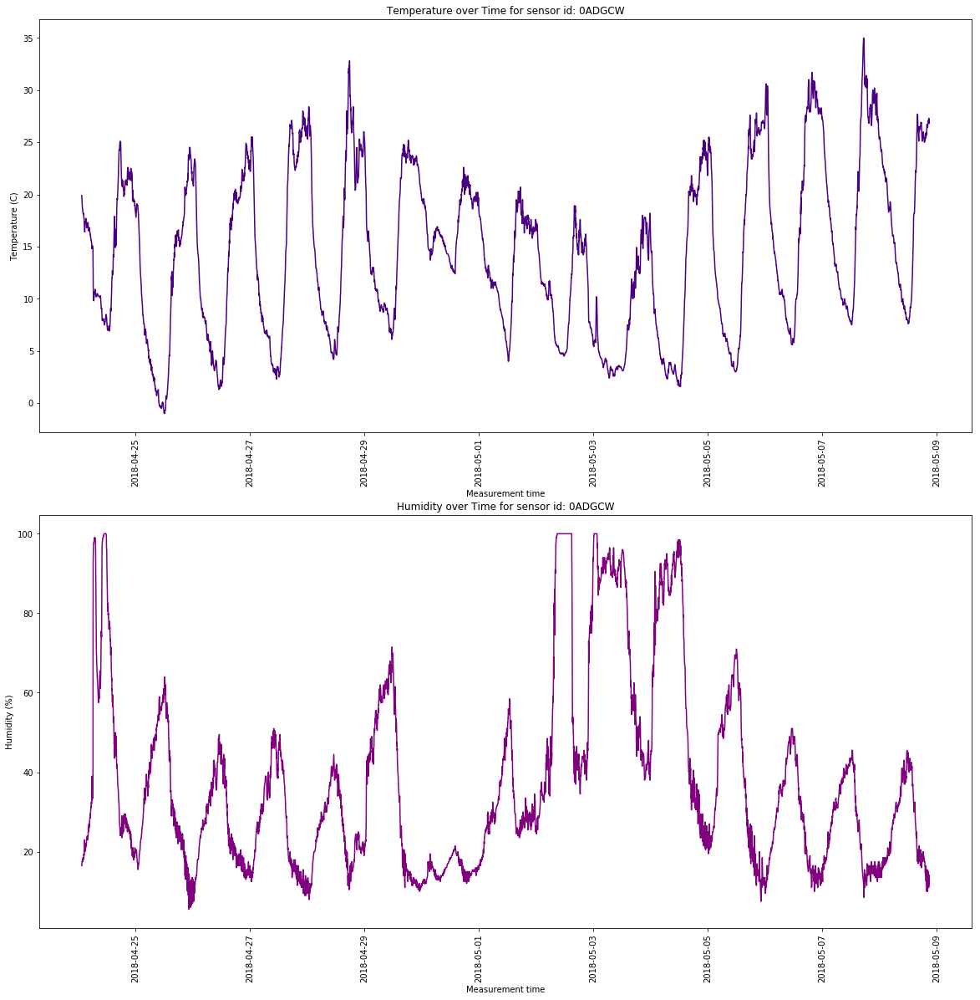

In [22]:
'''Experimental'''
#Plot temperature - time for one sensor, id=0ADGCW
a = np.unique(data.iloc[:,0], return_counts=False)
#Obtain temperatures and measurement time for specific sensor; id = 0ADGCW
tmp = data.loc[data['id'] == "0ADGCW", ['temp_celsius', 'rel_humidity','timestamp']]
#Convert to datetime objects
_time = [datetime.utcfromtimestamp(int(i)) for i in tmp['timestamp']]
#Bar plot with time on x-axis and temperature (celsius) on y-axis
fig, ax = plt.subplots(2, 1, figsize=(20,20))
ax.ravel()
ax[0].plot(_time, tmp['temp_celsius'], color='indigo')
ax[0].set_title("Temperature over Time for sensor id: %s" % a[2])
ax[0].set_xlabel("Measurement time")
ax[0].set_ylabel("Temperature (C)")
ax[1].plot(_time, tmp['rel_humidity'], color='purple')
ax[1].set_title("Humidity over Time for sensor id: %s" % a[2])
ax[1].set_xlabel("Measurement time")
ax[1].set_ylabel("Humidity (%)")
for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=90)  
plt.show()

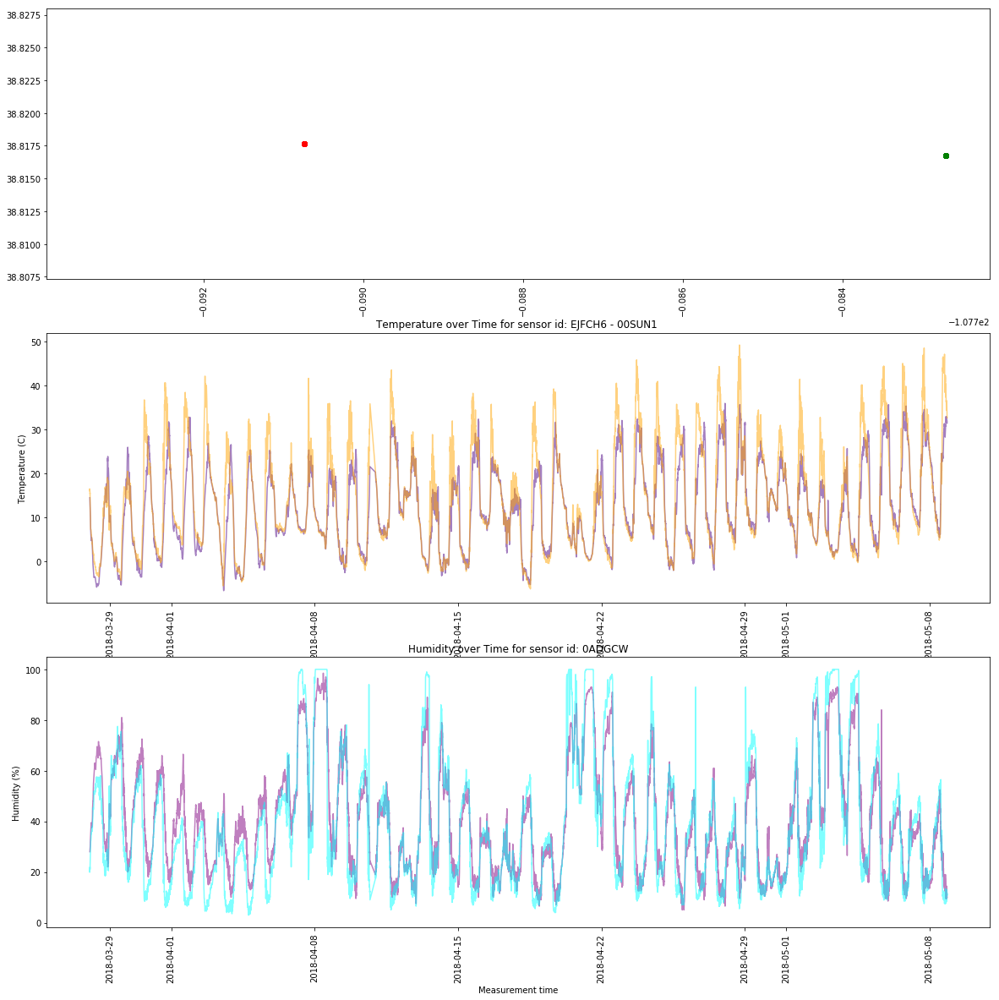

In [21]:
'''Experimental 2
Plot results on top of each other to show the differences
'''
#Plot temperature - time for one sensor, id=0ADGCW
a = np.unique(data.iloc[:,0], return_counts=False)
#Obtain temperatures and measurement time for specific sensor; id = 0ADGCW
tmp = data.loc[data['id'] == "EJFCH6", ['temp_celsius', 'rel_humidity','timestamp', 'latitude', 'longitude']]
#Obtain temperatures and measurement time for specific sensor; id = 0ADGCW
tmp2 = data.loc[data['id'] == "00SUN1", ['temp_celsius', 'rel_humidity','timestamp', 'latitude', 'longitude']]
#Convert to datetime objects
_time = [datetime.utcfromtimestamp(int(i)) for i in tmp['timestamp']]
#Convert to datetime objects
_time2 = [datetime.utcfromtimestamp(int(i)) for i in tmp2['timestamp']]
#Bar plot with time on x-axis and temperature (celsius) on y-axis
fig, ax = plt.subplots(3, 1, figsize=(20,20))
ax.ravel()
ax[0].scatter(tmp['longitude'],tmp['latitude'], color='red')
ax[0].scatter(tmp2['longitude'],tmp2['latitude'], color='green')
ax[1].plot(_time, tmp['temp_celsius'], color='indigo', alpha=.5)
ax[1].plot(_time2, tmp2['temp_celsius'], color='orange', alpha=.5)
ax[1].set_title("Temperature over Time for sensor id: %s - %s " % ("EJFCH6", "00SUN1"))
ax[1].set_xlabel("Measurement time")
ax[1].set_ylabel("Temperature (C)")
ax[2].plot(_time, tmp['rel_humidity'], color='purple', alpha=.5)
ax[2].plot(_time2, tmp2['rel_humidity'], color='cyan', alpha=.5)
ax[2].set_title("Humidity over Time for sensor id: %s" % a[2])
ax[2].set_xlabel("Measurement time")
ax[2].set_ylabel("Humidity (%)")
for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=90)  
plt.show()

In [23]:
#Minus zero temperatures, are they really there?
negs = [i for i in tmp["temp_celsius"] if i<0]
print(len(negs)) # There are 23 measurements below 0 celsius

23


In [24]:
'''
Plotting measurements taken by each sensor.
We loop through the sensor id's, for each sensor id, we plot the results from the list we defined below.
'''
#Taking temperature, humidity and time values in a list for each unique id
vals = []
for i in a:
    tmp = data.loc[data['id'] == str(i), ['temp_celsius', 'rel_humidity','timestamp']]
    vals.append(tmp)
#Plotting the result by iterating over each unique id
fig, ax = plt.subplots(127, 2, figsize=(20,450))
for i in range(127):
    _temp = [k for k in vals[i].iloc[:,0]]
    _relh = [k for k in vals[i].iloc[:,1]]
    _time = [datetime.utcfromtimestamp(int(k)) for k in vals[i].iloc[:,2]]
    ax[i,0].plot(_time, _temp, color='indigo', alpha=0.6)
    ax[i,1].plot(_time, _relh, color='orange', alpha=0.6)
    ax[i,0].set_title("Temperature over Time for sensor id: %s" % a[i])
    ax[i,1].set_title("Humidity over Time for sensor id: %s" % a[i])
    ax[i,0].set_ylabel("Temperature (C)")
    ax[i,1].set_ylabel("Humidity (%)")
plt.savefig("./out/p7-temp_humidity_by_id.png")
plt.close(fig)

## Results

Here we share the results of our experimental analysis results. By working on this dataset, we gained deeper information about the data provided, further we wrangled with the data and discovered the aspects as we dig deeper.  
This dataset contains sensor measurement records over time. There are 836668 datapoints in the dataset and each datapoint has 7 attributes; id, time stamp, temperature, humidity, latitude, longitude and movement. Between these attributes, only temperature and humidity have a strong correlation on negative side which is expected.  
When we looked to unique value distribution, we gained important knowledge about the dataset. This dataset has measurements from 127 different sensors. There are some sensors with almost no measurements. Temperature distribution is expected but the humidity distribution shows abnormality caused by a programming error that rounds measurements to nearest 5th percentage. Latitude and longitude has 89 unique values each.  
Using latitude and longitude values to plot the data was basic. We improved our work by using these values to cluster sensors. We used these location values to draw the boundaries of the map we need to draw, then applied clustering and HD map fetching in the same code and plotted the results.  
The time-based graph analysis provides the most detailed information. We plotted measurements for each sensor, that means 127 plots in total, which we can't explain one by one. However, we explained some important or odd aspects in the plots. Details can be observed from the plot itself provided with this paper.  
In addition to all the work we have done, in the process of analyzing the data, we still had some questions needed to be answered. We set-up a meeting with co-founder and senior programmer which was helpful to provide some answers to questions we had no answer for.The overall questions Smart Yields wanted answered:
* How to minimize the amount of sensors in a given location, while given the same amount of triggers of the current alert systems.
	* Example:  A farm has ten sensor which triggered 500 alerts.  What is the minimum about of sensors needed to provide the same amount of trigger alerts.
	* Future analysis of up-to-date data will help provide comparison analysis to determine what is the minimum about of sensor needed to provide the same accurate trigger alerts.	
* Confirmed all farmers share data within region as community data-share programs service provided.
* How the temperature flows throughout the region?
* How many hours was during each data frost period?
  
## Future Work
Throughout the project we experimented on different aspects of the data. But there are work that we could not apply due to time and computational resource limitations. There are some future work ideas that are not related to this project too. All these suggestions are based on our view of this dataset.
* This dataset contains temperature and humidity values over time. That by itself makes this data valuable. With the longer periods of time, global warming type of time-based researches can use the dataset.
* We clustered the datapoints by distance, but we didn't have time to compare in-class values. This can be an easy way to detect abnormalities, in other words broken sensors. 
* A machine learning algorithm or a neural network can be trained for the purpose of optimizing the number of sensors in the area using the current sensors and the difference between them.